In [1]:
# Include Necessary Libraries
from pyspark.sql.functions import *
from pyspark.sql.functions import mean as _mean, stddev as _stddev, col
from pyspark.sql import SparkSession
from pyspark.sql.types import *


In [2]:
# Init and start spark context

spark = SparkSession.builder.master('local[2]').enableHiveSupport().getOrCreate()
sc = spark.sparkContext

# Data Extraction

In [3]:
# Read/Show Customer Data
df_cust = spark.read.option("header", "true").csv("./dataset/olist_customers_dataset.csv").na.drop() # Customer info
df_cust = df_cust.withColumn("customer_zip_code_prefix_3digit", df_cust["customer_zip_code_prefix"].substr(0, 3).cast(IntegerType()))
df_cust.show()

+--------------------+--------------------+------------------------+--------------------+--------------+-------------------------------+
|         customer_id|  customer_unique_id|customer_zip_code_prefix|       customer_city|customer_state|customer_zip_code_prefix_3digit|
+--------------------+--------------------+------------------------+--------------------+--------------+-------------------------------+
|06b8999e2fba1a1fb...|861eff4711a542e4b...|                   14409|              franca|            SP|                            144|
|18955e83d337fd6b2...|290c77bc529b7ac93...|                   09790|sao bernardo do c...|            SP|                             97|
|4e7b3e00288586ebd...|060e732b5b29e8181...|                   01151|           sao paulo|            SP|                             11|
|b2b6027bc5c5109e5...|259dac757896d24d7...|                   08775|     mogi das cruzes|            SP|                             87|
|4f2d8ab171c80ec83...|345ecd01c38d18a90..

In [4]:
# Read/Show Geolocation Data
df_geo = spark.read.option("header", "true").csv("./dataset/olist_geolocation_dataset.csv")
df_geo.show()

+---------------------------+-------------------+-------------------+----------------+-----------------+
|geolocation_zip_code_prefix|    geolocation_lat|    geolocation_lng|geolocation_city|geolocation_state|
+---------------------------+-------------------+-------------------+----------------+-----------------+
|                      01037| -23.54562128115268| -46.63929204800168|       sao paulo|               SP|
|                      01046|-23.546081127035535| -46.64482029837157|       sao paulo|               SP|
|                      01046| -23.54612896641469| -46.64295148361138|       sao paulo|               SP|
|                      01041|  -23.5443921648681| -46.63949930627844|       sao paulo|               SP|
|                      01035|-23.541577961711493| -46.64160722329613|       sao paulo|               SP|
|                      01012|-23.547762303364266| -46.63536053788448|       são paulo|               SP|
|                      01047|-23.546273112412678| -46.6

In [5]:
# Read/Show Order Data
df_ord = spark.read.option("header", "true").csv("./dataset/olist_order_items_dataset.csv").na.drop().withColumnRenamed("order_id", "ord_order_id") # Join of order/product/seller
df_ord.show()

+--------------------+-------------+--------------------+--------------------+-------------------+------+-------------+
|        ord_order_id|order_item_id|          product_id|           seller_id|shipping_limit_date| price|freight_value|
+--------------------+-------------+--------------------+--------------------+-------------------+------+-------------+
|00010242fe8c5a6d1...|            1|4244733e06e7ecb49...|48436dade18ac8b2b...|2017-09-19 09:45:35| 58.90|        13.29|
|00018f77f2f0320c5...|            1|e5f2d52b802189ee6...|dd7ddc04e1b6c2c61...|2017-05-03 11:05:13|239.90|        19.93|
|000229ec398224ef6...|            1|c777355d18b72b67a...|5b51032eddd242adc...|2018-01-18 14:48:30|199.00|        17.87|
|00024acbcdf0a6daa...|            1|7634da152a4610f15...|9d7a1d34a50524090...|2018-08-15 10:10:18| 12.99|        12.79|
|00042b26cf59d7ce6...|            1|ac6c3623068f30de0...|df560393f3a51e745...|2017-02-13 13:57:51|199.90|        18.14|
|00048cc3ae777c65d...|            1|ef92

In [6]:
# Read/Show Payement Data
df_pay = spark.read.option("header", "true").csv("./dataset/olist_order_payments_dataset.csv").na.drop().withColumnRenamed("order_id", "pay_order_id") # Payement Info
df_pay.show()

+--------------------+------------------+------------+--------------------+-------------+
|        pay_order_id|payment_sequential|payment_type|payment_installments|payment_value|
+--------------------+------------------+------------+--------------------+-------------+
|b81ef226f3fe1789b...|                 1| credit_card|                   8|        99.33|
|a9810da82917af2d9...|                 1| credit_card|                   1|        24.39|
|25e8ea4e93396b6fa...|                 1| credit_card|                   1|        65.71|
|ba78997921bbcdc13...|                 1| credit_card|                   8|       107.78|
|42fdf880ba16b47b5...|                 1| credit_card|                   2|       128.45|
|298fcdf1f73eb413e...|                 1| credit_card|                   2|        96.12|
|771ee386b001f0620...|                 1| credit_card|                   1|        81.16|
|3d7239c394a212faa...|                 1| credit_card|                   3|        51.84|
|1f78449c8

In [7]:
# Read/Show Review Data
df_review = spark.read.option("header", "true").csv("./dataset/olist_order_reviews_dataset.csv").na.drop().withColumnRenamed("order_id", "review_order_id") # Review Info
df_review.show()




+--------------------+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|           review_id|     review_order_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|
+--------------------+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|8670d52e15e00043a...|b9bf720beb4ab3728...|           4|           recomendo|  aparelho eficient...| 2018-05-22 00:00:00|    2018-05-23 16:45:47|
|3948b09f7c818e2d8...|e51478e7e277a8374...|           5|     Super recomendo|  Vendedor confiáve...| 2018-05-23 00:00:00|    2018-05-24 03:00:01|
|373cbeecea8286a2b...|583174fbe37d3d5f0...|           1|Não chegou meu pr...|               Péssimo| 2018-08-15 00:00:00|    2018-08-15 04:10:37|
|d21bbc789670eab77...|4fc44d78867142c62...|           5|               Ótimo|          Loja nota 10| 2018-07-10 00:00:00|   

In [8]:
# Read/Show Order Info Data
df_ord_info = spark.read.option("header", "true").csv("./dataset/olist_orders_dataset.csv").na.drop().withColumnRenamed("order_id", "ordinfo_order_id")

# Join of Order / Customer & Order details
df_ord_info.show()

+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+
|    ordinfo_order_id|         customer_id|order_status|order_purchase_timestamp|  order_approved_at|order_delivered_carrier_date|order_delivered_customer_date|order_estimated_delivery_date|
+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+
|e481f51cbdc54678b...|9ef432eb625129730...|   delivered|     2017-10-02 10:56:33|2017-10-02 11:07:15|         2017-10-04 19:55:00|          2017-10-10 21:25:13|          2017-10-18 00:00:00|
|53cdb2fc8bc7dce0b...|b0830fb4747a6c6d2...|   delivered|     2018-07-24 20:41:37|2018-07-26 03:24:27|         2018-07-26 14:31:00|          2018-08-07 15:27:45|          2018-08-13 00:00:00|
|47770eb9100c2d0c4...|41ce2a54c0b03bf34...|  

In [9]:
# Read/Show Product Data
df_prod = spark.read.option("header", "true").csv("./dataset/olist_products_dataset.csv").na.drop() # Product
df_prod.dropna().show()


+--------------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+
|          product_id|product_category_name|product_name_lenght|product_description_lenght|product_photos_qty|product_weight_g|product_length_cm|product_height_cm|product_width_cm|
+--------------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+
|1e9e8ef04dbcff454...|           perfumaria|                 40|                       287|                 1|             225|               16|               10|              14|
|3aa071139cb16b67c...|                artes|                 44|                       276|                 1|            1000|               30|               18|              20|
|96bd76ec8810374ed...|        esporte_lazer|                 46|                       250|    

In [10]:
# Read/Show Seller Data
df_seller = spark.read.option("header", "true").csv("./dataset/olist_sellers_dataset.csv").na.drop() # Seller
df_seller.show()


+--------------------+----------------------+-----------------+------------+
|           seller_id|seller_zip_code_prefix|      seller_city|seller_state|
+--------------------+----------------------+-----------------+------------+
|3442f8959a84dea7e...|                 13023|         campinas|          SP|
|d1b65fc7debc3361e...|                 13844|       mogi guacu|          SP|
|ce3ad9de960102d06...|                 20031|   rio de janeiro|          RJ|
|c0f3eea2e14555b6f...|                 04195|        sao paulo|          SP|
|51a04a8a6bdcb23de...|                 12914|braganca paulista|          SP|
|c240c4061717ac180...|                 20920|   rio de janeiro|          RJ|
|e49c26c3edfa46d22...|                 55325|           brejao|          PE|
|1b938a7ec6ac5061a...|                 16304|        penapolis|          SP|
|768a86e36ad6aae3d...|                 01529|        sao paulo|          SP|
|ccc4bbb5f32a6ab2b...|                 80310|         curitiba|          PR|

In [11]:
# Read/Show English Product Name Data
df_prodName = spark.read.option("header", "true").csv("./dataset/product_category_name_translation.csv").na.drop() # Product Category
df_prodName.show()


+---------------------+-----------------------------+
|product_category_name|product_category_name_english|
+---------------------+-----------------------------+
|         beleza_saude|                health_beauty|
| informatica_acess...|         computers_accesso...|
|           automotivo|                         auto|
|      cama_mesa_banho|               bed_bath_table|
|     moveis_decoracao|              furniture_decor|
|        esporte_lazer|               sports_leisure|
|           perfumaria|                    perfumery|
| utilidades_domest...|                   housewares|
|            telefonia|                    telephony|
|   relogios_presentes|                watches_gifts|
|    alimentos_bebidas|                   food_drink|
|                bebes|                         baby|
|            papelaria|                   stationery|
| tablets_impressao...|         tablets_printing_...|
|           brinquedos|                         toys|
|       telefonia_fixa|     

# Data Processing

In [12]:
# Join between Customer and Order
cust_ord_join = df_cust.join(df_ord_info, df_cust.customer_id == df_ord_info.customer_id)

# Join between Product and Order
prod_ord_join = df_prod.join(df_ord, df_ord.product_id == df_prod.product_id)

# Join between Product, Order and Customer
prod_ord_ordinfo_join = prod_ord_join.join(cust_ord_join, cust_ord_join.ordinfo_order_id == prod_ord_join.ord_order_id)

# Join between Product, Order, Customer and payement
p = prod_ord_ordinfo_join.join(df_pay, df_pay.pay_order_id == prod_ord_ordinfo_join.ord_order_id)

# Join between Product, Order, Customer, payement, review
p1 = p.join(df_review, df_review.review_order_id == p.ord_order_id)

# Introduce new column with Payement_Type as Integer
p1 = p1.withColumn("Payement_Type_Int", p1["payment_type"].cast(IntegerType()))

#p1 = p1.withColumn("customer_zip_code_prefix_3digit", p1["customer_zip_code_prefix"].substr(0, 3).cast(IntegerType()))

p1 = p1.join(df_prodName, df_prodName.product_category_name == p1.product_category_name)


# Number of Products per month (1..12). 
prod_ord_ordinfo_join_map = prod_ord_ordinfo_join.rdd.map(lambda x: (int(x.order_purchase_timestamp.split(" ")[0].split('-')[1]), 1)).reduceByKey(lambda a,b: a+b).sortByKey()

# Number of Customers per month (1..12)  
# Assumption is each new order is considered as a new customer irrespective if its a repeat customer
cust_ord_join_map = cust_ord_join.rdd.map(lambda x: (int(x.order_purchase_timestamp.split(" ")[0].split('-')[1]), [x.ordinfo_order_id])).reduceByKey(lambda a,b: a + b).sortByKey().map(lambda x: (x[0],len(set(x[1]))))

# Total Price per month (1..12)
prod_ord_ordinfo_price_join_map = prod_ord_ordinfo_join.rdd.map(lambda x: (int(x.order_purchase_timestamp.split(" ")[0].split('-')[1]), float(x.price))).reduceByKey(lambda a,b: a+b).sortByKey()


#cust_ord_join = cust_ord_join.rdd.map(lambda x: (int(x.order_purchase_timestamp.split(" ")[0].split('-')[1]), 1)).reduceByKey(lambda a,b: a+b).sortByKey()


    


# Monthly Analysis

In [13]:
monthly_forecast_join = (prod_ord_ordinfo_join_map.join(cust_ord_join_map)).join(prod_ord_ordinfo_price_join_map)

monthly_forecast = monthly_forecast_join.map(lambda x: (x[0], x[1][0][0], x[1][0][1], x[1][1]))



In [14]:
df_monthly_forecast = monthly_forecast.toDF(["Month", "Product", "Customer", "Price"]).toPandas()
print(df_monthly_forecast[df_monthly_forecast.columns[1]])

0      8742
1      9192
2     10721
3     10253
4     11680
5     10415
6     11271
7     11833
8      4666
9      5463
10     8356
11     6051
Name: Product, dtype: int64


In [15]:
import matplotlib.pyplot as plt

month_names = ['Jan','Feb','Mar','April','May','Jun','Jul','Aug','Sept','Oct','Nov','Dec']
month = df_monthly_forecast[df_monthly_forecast.columns[0]]
product = df_monthly_forecast[df_monthly_forecast.columns[1]]
customer = df_monthly_forecast[df_monthly_forecast.columns[2]]
price = df_monthly_forecast[df_monthly_forecast.columns[3]] / 100

plt.figure(figsize=(20, 20), dpi=800)
plt.bar(month - 0.3, product, align='center', label = 'Products Sold', width=0.3)
plt.bar(month - 0.1, customer, align='center', label = 'Customers Visited', width=0.3)
plt.bar(month + 0.1, price, align='edge', label = 'Total Sales in 100\'s', width=0.3)

plt.xticks(month, month_names)
plt.tick_params(axis='x', labelsize=30)
plt.tick_params(axis='y', labelsize=30)
plt.xlabel("Months", fontsize=20)
plt.ylabel("Data", fontsize=20)
plt.title("Monthly Analysis", fontsize=20)
plt.legend(prop={"size":30})

plt.savefig('monthly_analysis.png')
plt.show()


### Monthly Analysis Conclusion:

1) We can see that May, August and July have the highest number of sales respectively. This maybe because of Summer break in Brazil (May/July) when people are in holiday mode and thus shopping spree. Also a sharp spike can be seen in August ie onset of fall season / end of summer season when new college terms start and there is a lot of back to school shopping going on.

2) It can be seen that the number of customers/products in highest month sale period ie May are almost same as other months, slightly higher but sales have spikked and the reason for this selling of high priced items.

# Hourly Analysis

In [16]:
# Number of Products per hour (1..12). 
prod_ord_ordinfo_join_map = prod_ord_ordinfo_join.rdd.map(lambda x: (int(x.order_purchase_timestamp.split(" ")[1].split(':')[0]), 1)).reduceByKey(lambda a,b: a+b).sortByKey()


# Number of Customers per hour (1..12)  
# Assumption is each new order is considered as a new customer irrespective if its a repeat customer
cust_ord_join_map = cust_ord_join.rdd.map(lambda x: (int(x.order_purchase_timestamp.split(" ")[1].split(':')[0]), [x.ordinfo_order_id])).reduceByKey(lambda a,b: a + b).sortByKey().map(lambda x: (x[0],len(set(x[1]))))


# Total Price per hour (1..12)
prod_ord_ordinfo_price_join_map = prod_ord_ordinfo_join.rdd.map(lambda x: (int(x.order_purchase_timestamp.split(" ")[1].split(':')[0]), float(x.price))).reduceByKey(lambda a,b: a+b).sortByKey()



In [17]:
for elem in prod_ord_ordinfo_price_join_map.collect():
    print(elem)

(0, 302296.5899999999)
(1, 146117.56999999995)
(2, 53329.28000000002)
(3, 31897.890000000014)
(4, 24068.550000000007)
(5, 21512.009999999995)
(6, 52574.23000000005)
(7, 146365.56000000003)
(8, 380067.93999999994)
(9, 656717.7000000001)
(10, 804881.5299999997)
(11, 841978.4599999996)
(12, 802118.2499999995)
(13, 840452.1499999996)
(14, 912425.22)
(15, 870013.65)
(16, 898612.5900000001)
(17, 800879.0499999999)
(18, 782414.32)
(19, 788351.0599999999)
(20, 821305.1300000001)
(21, 797622.37)
(22, 760694.2600000001)
(23, 509739.68)


In [18]:
hourly_forecast_join = (prod_ord_ordinfo_join_map.join(cust_ord_join_map)).join(prod_ord_ordinfo_price_join_map)

hourly_forecast = hourly_forecast_join.map(lambda x: (x[0], x[1][0][0], x[1][0][1], x[1][1]))

df_hourly_forecast = hourly_forecast.toDF(["Hour", "Product", "Customer", "Price"]).toPandas()


In [19]:
for elem in hourly_forecast_join.collect():
    print(elem)

(0, ((2616, 2322), 302296.5899999999))
(1, ((1242, 1132), 146117.56999999995))
(2, ((566, 496), 53329.28000000002))
(3, ((294, 259), 31897.890000000014))
(4, ((239, 203), 24068.550000000007))
(5, ((202, 182), 21512.009999999995))
(6, ((524, 477), 52574.23000000005))
(7, ((1324, 1199), 146365.56000000003))
(8, ((3299, 2906), 380067.93999999994))
(9, ((5259, 4647), 656717.7000000001))
(10, ((6786, 5978), 804881.5299999997))
(11, ((7167, 6384), 841978.4599999996))
(12, ((6561, 5800), 802118.2499999995))
(13, ((7124, 6307), 840452.1499999996))
(14, ((7309, 6383), 912425.22))
(15, ((7125, 6248), 870013.65))
(16, ((7365, 6474), 898612.5900000001))
(17, ((6737, 5959), 800879.0499999999))
(18, ((6293, 5585), 782414.32))
(19, ((6495, 5802), 788351.0599999999))
(20, ((6666, 6008), 821305.1300000001))
(21, ((6650, 6040), 797622.37))
(22, ((6300, 5656), 760694.2600000001))
(23, ((4500, 4014), 509739.68))


In [20]:
print(df_hourly_forecast)

    Hour  Product  Customer      Price
0      0     2616      2322  302296.59
1      1     1242      1132  146117.57
2      2      566       496   53329.28
3      3      294       259   31897.89
4      4      239       203   24068.55
5      5      202       182   21512.01
6      6      524       477   52574.23
7      7     1324      1199  146365.56
8      8     3299      2906  380067.94
9      9     5259      4647  656717.70
10    10     6786      5978  804881.53
11    11     7167      6384  841978.46
12    12     6561      5800  802118.25
13    13     7124      6307  840452.15
14    14     7309      6383  912425.22
15    15     7125      6248  870013.65
16    16     7365      6474  898612.59
17    17     6737      5959  800879.05
18    18     6293      5585  782414.32
19    19     6495      5802  788351.06
20    20     6666      6008  821305.13
21    21     6650      6040  797622.37
22    22     6300      5656  760694.26
23    23     4500      4014  509739.68


In [21]:
import matplotlib.pyplot as plt
import numpy as np
hour = df_hourly_forecast[df_hourly_forecast.columns[0]]
product = df_hourly_forecast[df_hourly_forecast.columns[1]]
customer = df_hourly_forecast[df_hourly_forecast.columns[2]]
price = df_hourly_forecast[df_hourly_forecast.columns[3]] / 100

plt.figure(figsize=(20, 20), dpi=800)
plt.bar(hour - 0.3, product, align='center', label = 'Products Sold', width=0.3)
plt.bar(hour - 0.1, customer, align='center', label = 'Customers Visited', width=0.3)
plt.bar(hour + 0.1, price, align='edge', label = 'Total Sales in 100\'s', width=0.3)


plt.xticks(np.arange(0, 24, 1.0))
plt.tick_params(axis='x', labelsize=30)
plt.tick_params(axis='y', labelsize=30)
plt.xlabel("Hour", fontsize=20)
plt.ylabel("Data", fontsize=20)
plt.title("Hourly Analysis", fontsize=20)
plt.legend(prop={"size":30})

plt.savefig('hourly_analysis.png')
plt.show()

### Hourly Analysis Conclusion

1) We can see that most of the shoppers purchase during the afternoon and evening times, making this is a very busy time the sellers.

2) 3-4am has the least buyers and looks like the best time for any daily website maintainance

# Spend Trend

In [93]:
pay_analysis = p1.rdd.map(lambda x: (x.payment_type, 1)).reduceByKey(lambda a,b: a+b)


In [23]:
import matplotlib.pyplot as plt

pay_types_label = []
pay_types_count = []

for elem in pay_analysis.collect():
    pay_types_label.append(elem[0])
    pay_types_count.append(elem[1])


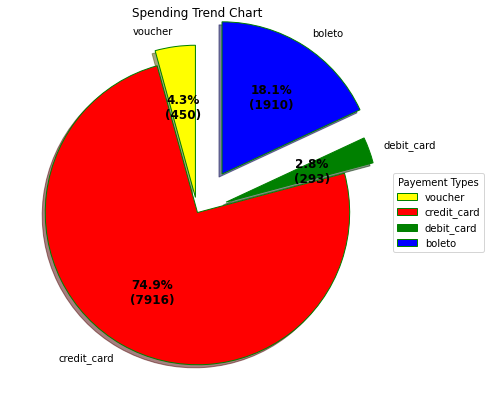

In [24]:
import numpy as np

# Creating explode data
explode = (0.1, 0.0, 0.2, 0.3)
  
# Creating color parameters
colors = ( "yellow", "red", "green",
          "blue", "red", "beige")
  
# Wedge properties
wp = { 'linewidth' : 1, 'edgecolor' : "green" }
  
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d})".format(pct, absolute)
  
# Creating plot
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(pay_types_count, 
                                  autopct = lambda pct: func(pct, pay_types_count),
                                  explode = explode, 
                                  labels = pay_types_label,
                                  shadow = True,
                                  colors = colors,
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color ="Black"))
  
# Adding legend
ax.legend(wedges, pay_types_label,
          title ="Payement Types",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))
  
plt.setp(autotexts, size = 12, weight ="bold")
ax.set_title("Spending Trend Chart")

plt.savefig('spend_piechart.png')
# show plot
plt.show()

### Spend Trend Analysis Conclusion :

1) It is quite evident from this bar graph that almost 3/4 of the customers use credit cards and a marginal section use debit card. This goes to show the popularity of credit cards which may be due to the various schemes that they have to offer. This also goes to show that the e-commerce company needs to beefup its cybersecurity to avoid being victim to credit card related frauds.

2) The next most preferred form of payement is Boleto ie payment method in Brazil regulated by FEBRABAN, short for Brazilian Federation of Banks.e

3) Vouchers are the 3rd most preferred forms of payement.

# Product Review Analysis

In [107]:
# Using product_id as key resulted in more than 1 product category having multiple keys
review_analysis = p1.rdd.map(lambda x: (x.product_id, (int(x.review_score), x.product_category_name_english))).reduceByKey(lambda a,b: (a[0]+b[0],a[1]))
review_analysis = review_analysis.map(lambda x: ( x[1][1], int(x[1][0]))).reduceByKey(lambda a,b: a+b)
review_analysis_top_10 = review_analysis.sortBy(lambda x: -x[1])
review_analysis_least_10 = review_analysis.sortBy(lambda x: x[1])


In [108]:
top_reviewed_products = []
top_reviewed_scores = []
least_reviewed_products = []
least_reviewed_scores = []
productid_list = []

for elem in review_analysis_top_10.collect():
    top_reviewed_products.append(elem[0])
    top_reviewed_scores.append(elem[1])

for elem in review_analysis_least_10.collect():
    least_reviewed_products.append(elem[0])
    least_reviewed_scores.append(elem[1])

    


In [109]:
print(top_reviewed_scores[0:10])
print(top_reviewed_products[0:10])


print(least_reviewed_scores[0:10])
print(least_reviewed_products[0:10])

[4025, 4002, 3196, 3095, 2667, 2374, 2344, 1969, 1449, 1413]
['health_beauty', 'bed_bath_table', 'housewares', 'watches_gifts', 'sports_leisure', 'computers_accessories', 'furniture_decor', 'auto', 'garden_tools', 'telephony']
[3, 5, 5, 5, 6, 7, 8, 14, 15, 23]
['flowers', 'tablets_printing_image', 'fashion_childrens_clothes', 'cds_dvds_musicals', 'dvds_blu_ray', 'fashion_underwear_beach', 'home_comfort_2', 'diapers_and_hygiene', 'books_imported', 'party_supplies']


In [111]:
import matplotlib.pyplot as plt

# Top 10
product_names = top_reviewed_products

plt.figure(figsize=(20, 20), dpi=800)
plt.bar(product_names[0:9], top_reviewed_scores[0:9], align='center', label = 'Top 10 Reviewed Products', width=0.1)


plt.tick_params(axis='x', labelsize=10)
plt.tick_params(axis='y', labelsize=10)
plt.xlabel("Products", fontsize=20)
plt.ylabel("Review Score", fontsize=20)
plt.title(" Reviewed Products Analysis", fontsize=20)
plt.legend(prop={"size":30})

plt.savefig('product_review_report_top_10.png')
plt.show()



In [113]:
# Least 10

product_names = least_reviewed_products

plt.figure(figsize=(20, 20), dpi=800)
plt.bar(product_names[0:9], least_reviewed_scores[0:9], align='center', label = 'Least 10 Reviewed Products', width=0.1)


plt.tick_params(axis='x', labelsize=10)
plt.tick_params(axis='y', labelsize=10)
plt.xlabel("Products", fontsize=20)
plt.ylabel("Review Score", fontsize=20)
plt.title(" Reviewed Products Analysis", fontsize=20)
plt.legend(prop={"size":30})

plt.savefig('product_review_report_least_10.png')
plt.show()

### Product Review Analysis Conclusion:

1) Top 10 reviewed products :

This is a very important analysis chart. It shows us which products have the highest review scores. It can be seen that health beauty is the most liked product followed by bed_bath_table and coming in at number 3 is housewares. The sellers can thus understand to keep high stocks of these products and to keep them as benchmarks.


2) Least 10 reviewed products :
It shows that flowers, tables_printing_image, fashion_children_clothes are the worst products based on customer reviews. Sellers should introduce strategy to improve their quality.

# Sales Prediction

In [29]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import Normalizer
from pyspark.ml.regression import LinearRegression


In [30]:

#price_date_map = prod_ord_ordinfo_join.rdd.map(lambda x: (float(x.price), int(x.order_purchase_timestamp.split(" ")[1].split(':')[0]), int(x.order_purchase_timestamp.split(" ")[0].split('-')[2]),int(x.order_purchase_timestamp.split(" ")[0].split('-')[1]), float(x.freight_value), float(x.product_description_lenght), float(x.product_weight_g)))
price_date_map = p1.rdd.map(lambda x: (float(x.price), int(x.order_purchase_timestamp.split(" ")[1].split(':')[0]), int(x.order_purchase_timestamp.split(" ")[0].split('-')[2]),int(x.order_purchase_timestamp.split(" ")[0].split('-')[1]), float(x.freight_value), float(x.product_description_lenght), float(x.product_weight_g), float(x.payment_value), float(x.payment_installments), int(x.review_score), int(x.product_photos_qty)))



In [31]:

p1.printSchema()

root
 |-- product_id: string (nullable = true)
 |-- product_category_name: string (nullable = true)
 |-- product_name_lenght: string (nullable = true)
 |-- product_description_lenght: string (nullable = true)
 |-- product_photos_qty: string (nullable = true)
 |-- product_weight_g: string (nullable = true)
 |-- product_length_cm: string (nullable = true)
 |-- product_height_cm: string (nullable = true)
 |-- product_width_cm: string (nullable = true)
 |-- ord_order_id: string (nullable = true)
 |-- order_item_id: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- shipping_limit_date: string (nullable = true)
 |-- price: string (nullable = true)
 |-- freight_value: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- customer_unique_id: string (nullable = true)
 |-- customer_zip_code_prefix: string (nullable = true)
 |-- customer_city: string (nullable = true)
 |-- customer_state: string (nullable = true)
 |

In [32]:
# Print
price_date_df = price_date_map.toDF(["Sales","Hour","Day","Month","freight_value","product_description_lenght","product_weight_g", "payement_value", "payment_installments","review_score","product_photos_qty"])

price_date_df.show()

#Count
price_date_df.count()

+------+----+---+-----+-------------+--------------------------+----------------+--------------+--------------------+------------+------------------+
| Sales|Hour|Day|Month|freight_value|product_description_lenght|product_weight_g|payement_value|payment_installments|review_score|product_photos_qty|
+------+----+---+-----+-------------+--------------------------+----------------+--------------+--------------------+------------+------------------+
|  59.9|  16|  9|    8|        14.73|                     892.0|          1200.0|         74.63|                 1.0|           5|                 2|
| 49.99|  19| 27|    8|        11.37|                     926.0|           700.0|         61.36|                 2.0|           4|                 2|
| 412.0|   8| 17|    4|        33.87|                     388.0|          3000.0|        445.87|                 9.0|           5|                 2|
|  72.9|  14|  2|    8|        14.09|                     155.0|           750.0|         86.99|    

10571

In [33]:
vectorAssembler = VectorAssembler(inputCols=["Hour","Day","Month","freight_value","product_description_lenght","product_weight_g", "payement_value", "payment_installments","review_score","product_photos_qty"], outputCol="features")
price_date_df_vectorized = vectorAssembler.transform(price_date_df)
price_date_df_vectorized.show()

+------+----+---+-----+-------------+--------------------------+----------------+--------------+--------------------+------------+------------------+--------------------+
| Sales|Hour|Day|Month|freight_value|product_description_lenght|product_weight_g|payement_value|payment_installments|review_score|product_photos_qty|            features|
+------+----+---+-----+-------------+--------------------------+----------------+--------------+--------------------+------------+------------------+--------------------+
|  59.9|  16|  9|    8|        14.73|                     892.0|          1200.0|         74.63|                 1.0|           5|                 2|[16.0,9.0,8.0,14....|
| 49.99|  19| 27|    8|        11.37|                     926.0|           700.0|         61.36|                 2.0|           4|                 2|[19.0,27.0,8.0,11...|
| 412.0|   8| 17|    4|        33.87|                     388.0|          3000.0|        445.87|                 9.0|           5|               

In [34]:
normalizer = Normalizer(inputCol="features", outputCol="normalizedFeatures", p=2.0)
price_date_df_vectorized_normalized = normalizer.transform(price_date_df_vectorized)
price_date_df_vectorized_normalized.show()

+------+----+---+-----+-------------+--------------------------+----------------+--------------+--------------------+------------+------------------+--------------------+--------------------+
| Sales|Hour|Day|Month|freight_value|product_description_lenght|product_weight_g|payement_value|payment_installments|review_score|product_photos_qty|            features|  normalizedFeatures|
+------+----+---+-----+-------------+--------------------------+----------------+--------------+--------------------+------------+------------------+--------------------+--------------------+
|  59.9|  16|  9|    8|        14.73|                     892.0|          1200.0|         74.63|                 1.0|           5|                 2|[16.0,9.0,8.0,14....|[0.01068596249099...|
| 49.99|  19| 27|    8|        11.37|                     926.0|           700.0|         61.36|                 2.0|           4|                 2|[19.0,27.0,8.0,11...|[0.01633718418360...|
| 412.0|   8| 17|    4|        33.87|   

In [35]:
split_df = price_date_df_vectorized_normalized.randomSplit([0.7, 0.3])

In [36]:
price_date_df_training = split_df[0]
price_date_df_test = split_df[1]

In [37]:
lr = LinearRegression(featuresCol = 'normalizedFeatures', labelCol='Sales', maxIter=20, regParam=1.0, elasticNetParam=1.0)

In [38]:
lr_model = lr.fit(price_date_df_training)

In [97]:
print("Model Coefficients: " + str(lr_model.coefficients))
print("Model Intercept: " + str(lr_model.intercept))

price_date_df_trainingprice_date_df_training = lr_model.summary
print("Root Mean Squared Error : %f" % price_date_df_trainingprice_date_df_training.rootMeanSquaredError)
print("R2: %f" % price_date_df_trainingprice_date_df_training.r2)

Model Coefficients: [-1207.9326206623655,-615.6383535399888,-7371.128144005936,-40.03983745978775,-165.12833380473054,-87.38229234317103,732.3071423238225,-6621.481605177596,974.2745458323013,0.0]
Model Intercept: 274.2531202644724
Root Mean Squared Error : 188.374016
R2: 0.517544


In [40]:
lr_price_prediction = lr_model.transform(price_date_df_test)
lr_price_prediction_df = lr_price_prediction.sort(lr_price_prediction.prediction.desc()).select('Hour', 'Day', 'Month', 'prediction')
lr_price_prediction_df_top10 = lr_price_prediction_df.head(10)

lr_price_prediction_df = lr_price_prediction_df.groupBy(['Day', 'Month']).agg({'prediction':'sum'}).orderBy(['Month','Day'])

#lr_price_prediction_df_top10 = lr_price_prediction_df.head(10).sort(lr_price_prediction.prediction.desc())
lr_price_prediction_pd = lr_price_prediction_df.toPandas()

lr_price_prediction_all = []

count = 0;

print(lr_price_prediction_pd)

for month in np.arange(1,13):
    for day in np.arange(1,32):
        if count < len(lr_price_prediction_pd) and day == lr_price_prediction_pd.iloc[count][0] and month == lr_price_prediction_pd.iloc[count][1]:
            lr_price_prediction_all.append(lr_price_prediction_pd.iloc[count][2])
            count = count +1
            #print(day, month, lr_price_prediction_pd.iloc[count-1][2], count)
        else:
            lr_price_prediction_all.append(np.random.randint(1000, 5000, 1)[0])

#for val in lr_price_prediction_df.collect(np.rand(100,200)):
#    if val[]
date = []
predicts = []


#for val in np.arange(0,365):
#    if val % 30 == 
for row in lr_price_prediction_df_top10:
    date.append('H:' + str(row[0]) + '-M:' + str(row[2]) + '-D:' + str(row[1]) )
    predicts.append(row[3])



     Day  Month  sum(prediction)
0      3      2       180.427812
1      9      2       172.066964
2     12      2       187.148930
3     21      2       154.131934
4     24      2       163.171476
..   ...    ...              ...
172   28      8       502.636775
173   29      8       193.999957
174    4      9       138.879158
175   12     12        65.508410
176   17     12       -46.009149

[177 rows x 3 columns]


In [41]:
print(lr_price_prediction_df_top10)


[Row(Hour=19, Day=1, Month=6, prediction=883.2841348683675), Row(Hour=0, Day=5, Month=7, prediction=863.0586484533933), Row(Hour=21, Day=26, Month=7, prediction=848.1201934175942), Row(Hour=19, Day=1, Month=6, prediction=828.761120096373), Row(Hour=19, Day=1, Month=6, prediction=828.761120096373), Row(Hour=15, Day=12, Month=8, prediction=825.0759394843826), Row(Hour=19, Day=18, Month=7, prediction=754.5363660014872), Row(Hour=18, Day=20, Month=3, prediction=754.4255645441958), Row(Hour=12, Day=22, Month=6, prediction=754.3142788831194), Row(Hour=9, Day=7, Month=5, prediction=752.4310420815164)]


In [42]:

print(len(lr_price_prediction_all))


372


In [43]:
import matplotlib.pyplot as plt

# Downsize predictions for plotting purposes
predicts_down = [predict / 10 for predict in predicts]

plt.figure(figsize=(20, 20), dpi=1000)
plt.bar(date, predicts_down, align='center', label = 'Top 10 Predicted Sales Times')


plt.yticks(np.arange(0, 100, 10))
plt.tick_params(axis='x', labelsize=15)
plt.tick_params(axis='y', labelsize=20)
plt.xlabel("Hour-Day-Month", fontsize=10)
plt.ylabel("Predicted Sales in 1000's Brazilian Real", fontsize=20)
plt.title("Future Sales ie Next Year - Top 10 Hours-Day-Month", fontsize=20)
plt.legend(prop={"size":30})


plt.savefig('predicted_sales.png')
plt.show()

In [44]:
import datetime as dt
import matplotlib.pyplot as plt
import numpy as np

def generate_data(data):
    num = len(data)
    #data = np.random.randint(0, 20, num)
    start = dt.datetime(2022, 1, 1)
    dates = [start + dt.timedelta(days=i) for i in range(num)]
    return dates, data

def calendar_array(dates, data):
    i, j = zip(*[d.isocalendar()[1:] for d in dates])
    i = np.array(i) - np.min(i)
    j = np.array(j) - 1
    ni = np.max(i) + 1

    calendar = np.nan * np.zeros((ni, 7))
    calendar[i, j] = data
    return i, j, calendar


def calendar_heatmap(ax, dates, data):
    i, j, calendar = calendar_array(dates, data)
    im = ax.imshow(calendar, interpolation='none', cmap='summer')
    label_days(ax, dates, i, j, calendar)
    label_months(ax, dates, i, j, calendar)
    ax.figure.colorbar(im)

def label_days(ax, dates, i, j, calendar):
    ni, nj = calendar.shape
    day_of_month = np.nan * np.zeros((ni, 7))
    day_of_month[i, j] = [d.day for d in dates]

    for (i, j), day in np.ndenumerate(day_of_month):
        if np.isfinite(day):
            ax.text(j, i, int(day), ha='center', va='center')

    ax.set(xticks=np.arange(7), 
           xticklabels=['M', 'T', 'W', 'R', 'F', 'S', 'S'])
    ax.xaxis.tick_top()

def label_months(ax, dates, i, j, calendar):
    month_labels = np.array(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul',
                             'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    months = np.array([d.month for d in dates])
    uniq_months = sorted(set(months))
    yticks = [i[months == m].mean() for m in uniq_months]
    labels = [month_labels[m - 1] for m in uniq_months]
    ax.set(yticks=yticks)
    ax.set_yticklabels(labels, rotation=90)

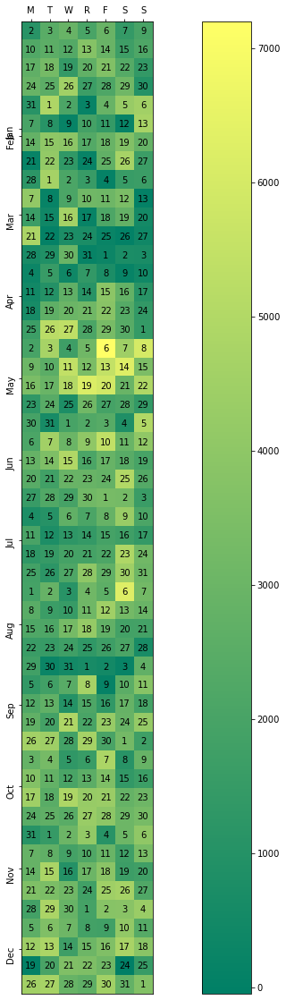

In [45]:
dates, data = generate_data(lr_price_prediction_all)
fig, ax = plt.subplots(figsize=(20, 20))
calendar_heatmap(ax, dates, data)

plt.savefig('predicted_sales_calender.png')
plt.show()



### Sales Prediction Analysis:

1) On using a Linear Regression ML model, we can see the above results, which shows the top 10 times in the following year with highest number of sales. This will help management to better prepare for these 10 days with product stock.

2) Also the Calender above gives us a more detailed view of which all days are going to be busy and need extra preparation to keep up to the demand.

# Geospatial Analysis

In [47]:



df_geo = df_geo.withColumn("geolocation_zip_code_prefix_first_digits", df_geo["geolocation_zip_code_prefix"].substr(0, 1).cast(IntegerType()))
df_geo = df_geo.withColumn("geolocation_zip_code_prefix_second_digits", df_geo["geolocation_zip_code_prefix"].substr(0, 2).cast(IntegerType()))
df_geo = df_geo.withColumn("geolocation_zip_code_prefix_third_digits", df_geo["geolocation_zip_code_prefix"].substr(0, 3).cast(IntegerType()))
df_geo = df_geo.withColumn("geolocation_zip_code_prefix_fourth_digits", df_geo["geolocation_zip_code_prefix"].substr(0, 4).cast(IntegerType()))
df_geo = df_geo.withColumn("geolocation_zip_code_prefix_int",df_geo["geolocation_zip_code_prefix"].cast(IntegerType()))
df_geo = df_geo.withColumn("geolocation_latflo", df_geo["geolocation_lat"].cast(FloatType()))
df_geo = df_geo.withColumn("geolocation_lngflo", df_geo["geolocation_lng"].cast(FloatType()))




In [49]:
df_geo.printSchema()

root
 |-- geolocation_zip_code_prefix: string (nullable = true)
 |-- geolocation_lat: string (nullable = true)
 |-- geolocation_lng: string (nullable = true)
 |-- geolocation_city: string (nullable = true)
 |-- geolocation_state: string (nullable = true)
 |-- geolocation_zip_code_prefix_first_digits: integer (nullable = true)
 |-- geolocation_zip_code_prefix_second_digits: integer (nullable = true)
 |-- geolocation_zip_code_prefix_third_digits: integer (nullable = true)
 |-- geolocation_zip_code_prefix_fourth_digits: integer (nullable = true)
 |-- geolocation_zip_code_prefix_int: integer (nullable = true)
 |-- geolocation_latflo: float (nullable = true)
 |-- geolocation_lngflo: float (nullable = true)



In [53]:
df_geo2 = p1.groupby(['customer_zip_code_prefix_3digit']).agg({'price':'sum'}).withColumnRenamed("sum(price)","revenue").withColumnRenamed("sum(price)","revenue")

df_geo2.show()


df_geo_revenue = df_geo.join(df_geo2, df_geo2.customer_zip_code_prefix_3digit == df_geo.geolocation_zip_code_prefix_third_digits)
df_geo_revenue.show(5)

+-------------------------------+------------------+
|customer_zip_code_prefix_3digit|           revenue|
+-------------------------------+------------------+
|                            463|             92.89|
|                            148|            3504.8|
|                            833|            559.56|
|                            471|            174.32|
|                            392|           1684.18|
|                            858| 4656.759999999999|
|                            243| 4803.419999999999|
|                            737|135.26999999999998|
|                            897|184.88000000000002|
|                            623|            1055.0|
|                            540|             265.9|
|                             31| 2919.100000000001|
|                             85| 9649.059999999998|
|                            451|176.48000000000002|
|                            137|           2108.15|
|                            580|12625.8299999

In [54]:
df_geo_pd = df_geo_revenue.toPandas()



In [55]:
from datashader.utils import lnglat_to_meters as webm
import pandas as pd

x, y = webm(df_geo_pd.geolocation_lngflo, df_geo_pd.geolocation_latflo)
df_geo_pd['x'] = pd.Series(x)
df_geo_pd['y'] = pd.Series(y)



brazil = df_geo_pd
agg_name = 'revenue'
brazil[agg_name].describe().to_frame()

/Users/sahilchitnis/opt/anaconda3/envs/project/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
/Users/sahilchitnis/opt/anaconda3/envs/project/lib/python3.6/site-packages/dask/dataframe/utils.py:13: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


,revenue
count,989211.000000
mean,3442.633952
std,3136.334232
min,6.000000
25%,1240.940000
50%,2630.380000
75%,4656.760000
max,19680.330000


Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
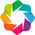

In [56]:
# plot wtih holoviews + datashader - bokeh with map background
import holoviews as hv
import geoviews as gv
import datashader as ds
from colorcet import fire, rainbow, bgy, bjy, bkr, kb, kr
from datashader.colors import colormap_select, Greys9
from holoviews.streams import RangeXY
from holoviews.operation.datashader import datashade, dynspread, rasterize
from bokeh.io import push_notebook, show, output_notebook
output_notebook()
hv.extension('bokeh')

%opts Overlay [width=800 height=600 toolbar='above' xaxis=None yaxis=None]
%opts QuadMesh [tools=['hover'] colorbar=True] (alpha=0 hover_alpha=0.2)

T = 0.05
PX = 1

def plot_map(data, label, agg_data, agg_name, cmap):
    url="http://server.arcgisonline.com/ArcGIS/rest/services/Canvas/World_Dark_Gray_Base/MapServer/tile/{Z}/{Y}/{X}.png"
    geomap = gv.WMTS(url)
    points = hv.Points(gv.Dataset(data, kdims=['x', 'y'], vdims=[agg_name]))
    agg = datashade(points, element_type=gv.Image, aggregator=agg_data, cmap=cmap)
    zip_codes = dynspread(agg, threshold=T, max_px=PX)
    hover = hv.util.Dynamic(rasterize(points, aggregator=agg_data, width=50, height=25, streams=[RangeXY]), operation=hv.QuadMesh)
    hover = hover.options(cmap=cmap)
    img = geomap * zip_codes * hover
    img = img.relabel(label)
    return img

In [57]:
plot_map(brazil, 'Revenue Distribution Brazil', ds.min(agg_name), agg_name, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y revenue)

### Geospatial Analysis Conclusion:

1) This map using Bokeh Visualization , ARCGIS and Holoviews/Geoviews is a easy to view map representation of areas with most number of customers/sales . This will help management to better focus on areas with less customer concentration to introduce strategy that will up the sales there. Also increase supply, manpower, more servers at areas with heavy load.

2) The best part is this map can be dived into

# Customer Segmentation

In [58]:
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark.sql.functions import to_timestamp
from pyspark.sql import functions as F

cs_analysis_df = df_pay.join(df_ord_info, df_pay.pay_order_id == df_ord_info.ordinfo_order_id)
cs_analysis_df = cs_analysis_df[['pay_order_id','payment_value','customer_id','order_purchase_timestamp']]
cs_analysis_df = cs_analysis_df.withColumn('Date',cs_analysis_df['order_purchase_timestamp'].cast(DateType()))

In [59]:

cs_analysis_df.select(F.max('Date')).show()

+----------+
| max(Date)|
+----------+
|2018-08-29|
+----------+



In [60]:
cs_analysis_df= cs_analysis_df.withColumn("RecencyDays", expr("datediff('2018-10-17', Date)"))

In [61]:
rfm_table = cs_analysis_df.groupBy("customer_id").agg(min("RecencyDays").alias("Recency"),count("pay_order_id").alias("Frequency"),sum("payment_value").alias("Monetary"))

In [62]:
rfm_table.show(20)

+--------------------+-------+---------+------------------+
|         customer_id|Recency|Frequency|          Monetary|
+--------------------+-------+---------+------------------+
|f54a9f0e6b351c431...|    632|        1|             35.95|
|2a1dfb647f32f4390...|    138|        1|            508.17|
|4f28355e5c17a4a42...|    517|        1|            153.72|
|4632eb5a8f175f6fe...|    321|        1|             91.66|
|843ff05b30ce4f75b...|    338|        1|            102.74|
|a4156bb8aff5d6722...|    386|        1|            206.87|
|1099d033c74a027a7...|    263|        1|              61.7|
|7a3bd3b37285f0ab2...|    587|        2|            473.12|
|5fff39f1b59dc4d2f...|    534|        1|             90.58|
|18f6ca10777417c93...|    272|        1|             61.36|
|f1e46939e6408b3e6...|    503|        1|              53.0|
|a8695124db570d100...|    329|        1|             85.24|
|545b9a267af9ba134...|    245|        1|            130.83|
|90d7075599361b694...|    446|        1|

In [63]:
r_quartile = rfm_table.approxQuantile("Recency", [0.25, 0.5, 0.75], 0)
f_quartile = rfm_table.approxQuantile("Frequency", [0.25, 0.5, 0.75], 0)
m_quartile = rfm_table.approxQuantile("Monetary", [0.25, 0.5, 0.75], 0)

In [64]:
rfm_table = rfm_table.withColumn("R_Quartile", \
                                 when(col("Recency") >= r_quartile[2] , 1).\
                                 when(col("Recency") >= r_quartile[1] , 2).\
                                 when(col("Recency") >= r_quartile[0] , 3).\
                                 otherwise(4))

In [65]:
rfm_table = rfm_table.withColumn("F_Quartile", \
                                 when(col("Frequency") > f_quartile[2] , 4).\
                                 when(col("Frequency") > f_quartile[1] , 3).\
                                 when(col("Frequency") > f_quartile[0] , 2).\
                                 otherwise(1))

In [66]:
rfm_table = rfm_table.withColumn("M_Quartile", \
                                 when(col("Monetary") >= m_quartile[2] , 4).\
                                 when(col("Monetary") >= m_quartile[1] , 3).\
                                 when(col("Monetary") >= m_quartile[0] , 2).\
                                 otherwise(1))

In [67]:
rfm_table = rfm_table.withColumn("RFM_Score", concat(col("R_Quartile"), col("F_Quartile"), col("M_Quartile")))

In [68]:
rfm_table.show(10)

+--------------------+-------+---------+--------+----------+----------+----------+---------+
|         customer_id|Recency|Frequency|Monetary|R_Quartile|F_Quartile|M_Quartile|RFM_Score|
+--------------------+-------+---------+--------+----------+----------+----------+---------+
|f54a9f0e6b351c431...|    632|        1|   35.95|         1|         1|         1|      111|
|2a1dfb647f32f4390...|    138|        1|  508.17|         4|         1|         4|      414|
|4f28355e5c17a4a42...|    517|        1|  153.72|         1|         1|         3|      113|
|4632eb5a8f175f6fe...|    321|        1|   91.66|         2|         1|         2|      212|
|843ff05b30ce4f75b...|    338|        1|  102.74|         2|         1|         2|      212|
|a4156bb8aff5d6722...|    386|        1|  206.87|         2|         1|         4|      214|
|1099d033c74a027a7...|    263|        1|    61.7|         3|         1|         1|      311|
|7a3bd3b37285f0ab2...|    587|        2|  473.12|         1|         4

In [69]:
!pip install chart_studio

In [70]:
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

In [71]:
grouped_by_rfmscore = rfm_table.groupBy("RFM_Score").count().orderBy("count", ascending=False)
grouped_by_rfmscore_pandas = grouped_by_rfmscore.toPandas()
grouped_by_rfmscore_pandas

,RFM_Score,count
0,111,6045
1,413,6001
2,414,5978
3,313,5959
4,212,5936
5,112,5933
6,314,5902
7,311,5879
8,213,5859
9,214,5824


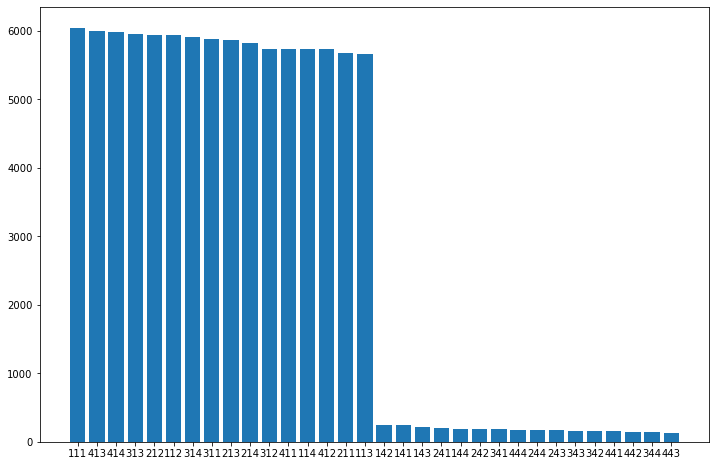

In [72]:
grouped_by_rfmscore_pandas.to_csv('big_data_project')
from pandas import Series, DataFrame
import matplotlib.pyplot as plt


plt.figure(figsize=(12,8))
plt.bar(grouped_by_rfmscore_pandas['RFM_Score'],grouped_by_rfmscore_pandas['count'])
plt.show()

According to RFM analysis, we are assigning score from 1 to 4 to each customer, where 1 denotes worst performance and 4 denotes best performance. Surprisingly, the worst customers compose the largest segmentation. The second larst one is 413, which means high spending new customers. We can utilize markting campaigns to increase the frequency and spending per time of customers


# Recommender System

In [73]:
recom_sys_df = df_ord.join(df_ord_info, df_ord.ord_order_id == df_ord_info.ordinfo_order_id)
recom_sys_df = recom_sys_df.join(df_review, df_review.review_order_id == recom_sys_df.ord_order_id)#.withColumnRenamed("product_id", "recomm_product_id")

prod_names = df_prod.join(df_prodName, df_prod.product_category_name == df_prodName.product_category_name)
prod_names_pd = prod_names.toPandas()

#recom_sys_df = recom_sys_df.join(prod_names, prod_names.product_id == recom_sys_df.recomm_product_id)
                                 
                                 
recom_sys_df = recom_sys_df[['review_order_id','product_id','customer_id','review_score']]
recom_sys_df = recom_sys_df.withColumn('review_score', recom_sys_df['review_score'].cast(IntegerType()))
recom_sys_df.show()

+--------------------+--------------------+--------------------+------------+
|     review_order_id|          product_id|         customer_id|review_score|
+--------------------+--------------------+--------------------+------------+
|53cdb2fc8bc7dce0b...|595fac2a385ac33a8...|b0830fb4747a6c6d2...|           4|
|dcb36b511fcac050b...|009c09f439988bc06...|3b6828a50ffe54694...|           5|
|f3e7c359154d96582...|e99d69efe684efaa6...|62b423aab58096ca5...|           5|
|acce194856392f074...|9451e630d725c4bb7...|7e20bf5ca92da6820...|           1|
|acce194856392f074...|d70f38e7f79c630f8...|7e20bf5ca92da6820...|           1|
|1790eea0b567cf509...|2d8f2be4f08788ee3...|52142aa69d8d0e124...|           1|
|434d158e96bdd6972...|c7df652246ed7b330...|2a1dfb647f32f4390...|           5|
|5820a1100976432c7...|1deda1acffb44ed38...|2b56e94c2f66f2d97...|           5|
|9faeb9b2746b9d752...|f48eb5c2fde13ca63...|79183cd650e2bb0d4...|           1|
|9faeb9b2746b9d752...|f48eb5c2fde13ca63...|79183cd650e2bb0d4...|

In [74]:
from pyspark.ml.feature import StringIndexer
from pyspark.ml import Pipeline
from pyspark.sql.functions import col

indexer = [StringIndexer(inputCol=column, outputCol=column+"_index") for column in list(set(recom_sys_df.columns)-set(['review_score'])) ]
pipeline = Pipeline(stages=indexer)
transformed = pipeline.fit(recom_sys_df).transform(recom_sys_df)
transformed.show()

+--------------------+--------------------+--------------------+------------+---------------------+-----------------+----------------+
|     review_order_id|          product_id|         customer_id|review_score|review_order_id_index|customer_id_index|product_id_index|
+--------------------+--------------------+--------------------+------------+---------------------+-----------------+----------------+
|0420da8d50a378401...|5ca739ddd646d1ba5...|0949b5cf9adad08c1...|           5|               2013.0|           8067.0|          3570.0|
|05d46826bd0fb605d...|e84d1a4a08db13e8d...|c5a9ffc867b51a706...|           4|               5320.0|           1620.0|          3467.0|
|08791ec24b12af5af...|11250b0d4b709fee9...|98910418a06188d89...|           5|               3430.0|           1140.0|          1159.0|
|09e90e3936db197d4...|e4c7ed7a832858c17...|35eb8474043d903a1...|           1|               4017.0|           4243.0|           801.0|
|0d4a43cf7b7994e0a...|51fed4afb1b41d00a...|967cb8f7540c

In [75]:
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.recommendation import ALS
from pyspark.sql import Row

In [76]:
(training, test) = transformed.randomSplit([0.8, 0.2])

In [77]:
als = ALS(userCol="customer_id_index", itemCol="product_id_index", ratingCol="review_score",
          coldStartStrategy="drop", nonnegative = True, implicitPrefs = False)

In [78]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

In [79]:
param_grid = ParamGridBuilder() .addGrid(als.rank, [10, 50, 75, 100]) \
 .addGrid(als.maxIter, [5, 50, 75, 100]) \
 .addGrid(als.regParam, [.01, .05, .1, .15]) \
 .build()
# Define evaluator as RMSE
evaluator=RegressionEvaluator(metricName='rmse',labelCol='review_score',predictionCol='prediction')
cv = CrossValidator(estimator = als, estimatorParamMaps = param_grid, evaluator = evaluator, numFolds = 5)
model = als.fit(training)

In [80]:
predictions=model.transform(test)
rmse=evaluator.evaluate(predictions)
print("RMSE="+str(rmse))

RMSE=0.9167420768771523


In [81]:
predictions.show(n = 10)

+--------------------+--------------------+--------------------+------------+---------------------+-----------------+----------------+----------+
|     review_order_id|          product_id|         customer_id|review_score|review_order_id_index|customer_id_index|product_id_index|prediction|
+--------------------+--------------------+--------------------+------------+---------------------+-----------------+----------------+----------+
|14282bc70be9bdda5...|b05e00841a6dad404...|19cecb194f54e614b...|           2|                715.0|            677.0|          1238.0| 1.9147557|
|40e4b27fe658a1c1e...|ec2d43cc59763ec91...|dcbb7859db42a729d...|           5|                209.0|            115.0|           243.0|  2.738864|
|8a11d6c9768fa4f00...|33b9801fec06f14bb...|eae75372ee0e92b80...|           5|                391.0|            640.0|           623.0|  4.948187|
|aa2dc936dd126536c...|e27e689c4ce425f2f...|3be90202886d6cb57...|           2|                 90.0|             91.0|       

In [82]:
user_recs=model.recommendForAllUsers(20).show(10, False)

+-----------------+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|customer_id_index|recommendations                                                                                                                                                                                                                                                                                                                                                                        |
+-----------------+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [83]:
import pandas as pd
recs=model.recommendForAllUsers(10).toPandas()
nrecs=recs.recommendations.apply(pd.Series) \
            .merge(recs, right_index = True, left_index = True) \
            .drop(["recommendations"], axis = 1) \
            .melt(id_vars = ['customer_id_index'], value_name = "recommendation") \
            .drop("variable", axis = 1) \
            .dropna() 
nrecs=nrecs.sort_values('customer_id_index')
nrecs=pd.concat([nrecs['recommendation'].apply(pd.Series), nrecs['customer_id_index']], axis = 1)

In [84]:
print(nrecs)

            0         1  customer_id_index
21168  1827.0  2.965889                  0
56958   950.0  2.888759                  0
6852   1280.0  3.032374                  0
49800  5073.0  2.899971                  0
35484  4927.0  2.910692                  0
...       ...       ...                ...
10671  3939.0  4.867732               8697
17829  4154.0  4.712366               8697
67935   675.0  4.522111               8697
39303  4312.0  4.629354               8697
60777  2072.0  4.557257               8697

[71580 rows x 3 columns]


In [85]:
nrecs.columns = ['ProductID_index','Rating','UserID_index']

In [86]:
md=transformed.select(transformed['customer_id'],transformed['customer_id_index'],transformed['product_id'],transformed['product_id_index'])

In [87]:
spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "true")

In [88]:
pmd = md.toPandas()
print(pmd)

                            customer_id  customer_id_index  \
0      b0830fb4747a6c6d20dea0b8c802d7ef             6812.0   
1      3b6828a50ffe546942b7a473d70ac0fc             7473.0   
2      62b423aab58096ca514ba6aa06be2f98             5151.0   
3      7e20bf5ca92da68200643bda76c504c6              873.0   
4      7e20bf5ca92da68200643bda76c504c6              873.0   
...                                 ...                ...   
10265  d7475a536385854da614094f0bf12275             5409.0   
10266  e450a297a7bc6839ceb0cf1a2377fa02             7786.0   
10267  6d63fa86bd2f62908ad328325799152f             5200.0   
10268  aaa423fb52f4106f477683490cbd5845             5629.0   
10269  cf97e9cf454480b303de6736ddd15fd6             4603.0   

                             product_id  product_id_index  
0      595fac2a385ac33a80bd5114aec74eb8              19.0  
1      009c09f439988bc06a93d6b8186dce73            2461.0  
2      e99d69efe684efaa643f99805f7c81bc            1904.0  
3      9451e630

In [89]:
dict1 =dict(zip(pmd['customer_id_index'],pmd['customer_id']))
dict2=dict(zip(pmd['product_id_index'],pmd['product_id']))
nrecs['customer_id']=nrecs['UserID_index'].map(dict1)
nrecs['product_id']=nrecs['ProductID_index'].map(dict2)
nrecs=nrecs.sort_values('customer_id')
nrecs.reset_index(drop=True, inplace=True)
new=nrecs[['customer_id','product_id','Rating']]
new['recommendations'] = list(zip(new.product_id, new.Rating))
res=new[['customer_id','recommendations']]  
res_new=res['recommendations'].groupby([res.customer_id]).apply(list).reset_index()
print(new)

                            customer_id                        product_id  \
0      001051abfcfdbed9f87b4266213a5df1  24bc2932a12c983f8e76d828b65cf39b   
1      001051abfcfdbed9f87b4266213a5df1  cc1829caca1897ee76144ef20a32330f   
2      001051abfcfdbed9f87b4266213a5df1  04433a8021475a2002663f94203c88da   
3      001051abfcfdbed9f87b4266213a5df1  66d59b954a33c0c14fc6b88548833370   
4      001051abfcfdbed9f87b4266213a5df1  ccf965dc2dedc243ce245610ffcc1e6b   
...                                 ...                               ...   
71575  ffff42319e9b2d713724ae527742af25  499152ec860819480e1b2d5598d1e29f   
71576  ffff42319e9b2d713724ae527742af25  e61c78a7343d82c0539d27df0f7dfc31   
71577  ffff42319e9b2d713724ae527742af25  74edd82bf577cf5da467e2ba67c8305f   
71578  ffff42319e9b2d713724ae527742af25  bec2975b905c2d5a70fd97abf8c894e3   
71579  ffff42319e9b2d713724ae527742af25  57ba9fd4b96512b1aced2dd46e1aea68   

         Rating                                    recommendations  
0     

/Users/sahilchitnis/opt/anaconda3/envs/project/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### Join product name for better analysis 

In [90]:
df5=new[['customer_id','product_id','Rating']]

df6 = pd.merge(df5,prod_names_pd,on='product_id')

df6['recommendations']=list(zip(df6.product_category_name_english,df6.Rating))
df_pd=df6[['customer_id','recommendations']]  
df_pd2=df_pd['recommendations'].groupby([df_pd.customer_id]).apply(list).reset_index()
df_pd2

,customer_id,recommendations
0,001051abfcfdbed9f87b4266213a5df1,"[(health_beauty, 4.691303730010986), (sports_l..."
1,0013cd8e350a7cc76873441e431dd5ee,"[(housewares, 4.432621002197266), (sports_leis..."
2,0015bc9fd2d5395446143e8b215d7c75,"[(auto, 4.914447784423828), (bed_bath_table, 4..."
3,0018c09f333634ca9c80d9ff46e43e9c,"[(auto, 4.56040096282959), (construction_tools..."
4,001df1ee5c36767aa607001ab1a13a06,"[(auto, 4.625909805297852), (construction_tool..."
...,...,...
7153,ffde64401f7cb62d2e8696d9467c781d,"[(auto, 4.171812534332275), (health_beauty, 4...."
7154,ffdf82f47307e5b56f341a499bd268c6,"[(housewares, 4.689406871795654), (housewares,..."
7155,ffe6224c02307bc5fd2e5c7566bd674a,"[(bed_bath_table, 5.2695488929748535), (health..."
7156,fff212062d600f2e1d53f3c5d4a25138,"[(pet_shop, 4.853644371032715), (health_beauty..."


In [91]:
df_pd2.to_csv('recommendation_product_data.csv')